# Credit Card Churn Rate Prediction

In [15]:
import numpy as np
import pandas as pd
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
import plotly.io as pio
from scipy import stats
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, RobustScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.metrics import confusion_matrix, recall_score, accuracy_score, ConfusionMatrixDisplay
from xgboost import plot_tree

In [2]:
def display_full(df):
    """
    Display a DataFrame with horizontal scroll.
    Args:
    df (pd.DataFrame): The DataFrame to display.
    """
    pd.set_option('display.max_columns', None) # Ensure all columns are shown
    pd.set_option('display.expand_frame_repr', False) # Prevent DataFrame wrapping
    display(df)   

In [3]:
df = pd.read_csv("BankChurners.csv")

In [4]:
# Overview of the dataset
display_full(df.head())

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [5]:
df.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [7]:
duplicates = df.duplicated()
print(df[duplicates])

Empty DataFrame
Columns: [CLIENTNUM, Attrition_Flag, Customer_Age, Gender, Dependent_count, Education_Level, Marital_Status, Income_Category, Card_Category, Months_on_book, Total_Relationship_Count, Months_Inactive_12_mon, Contacts_Count_12_mon, Credit_Limit, Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Trans_Ct, Total_Ct_Chng_Q4_Q1, Avg_Utilization_Ratio, Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1, Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2]
Index: []


In [8]:
df.drop(columns=["CLIENTNUM",
                 "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1",
                "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"], 
        inplace=True)

In [9]:
# Check for null-value and columns' dtype
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

---
## Exploratory Data Analysis
---

In [10]:
# Subset dataframe into categorical and numerical features
categorical_features = df.select_dtypes(include=[object])
numerical_features = df.select_dtypes(include=[np.number])

In [11]:
for i in categorical_features.columns:
    print(categorical_features[i].value_counts())

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64
Gender
F    5358
M    4769
Name: count, dtype: int64
Education_Level
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: count, dtype: int64
Marital_Status
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: count, dtype: int64
Income_Category
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: count, dtype: int64
Card_Category
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: count, dtype: int64


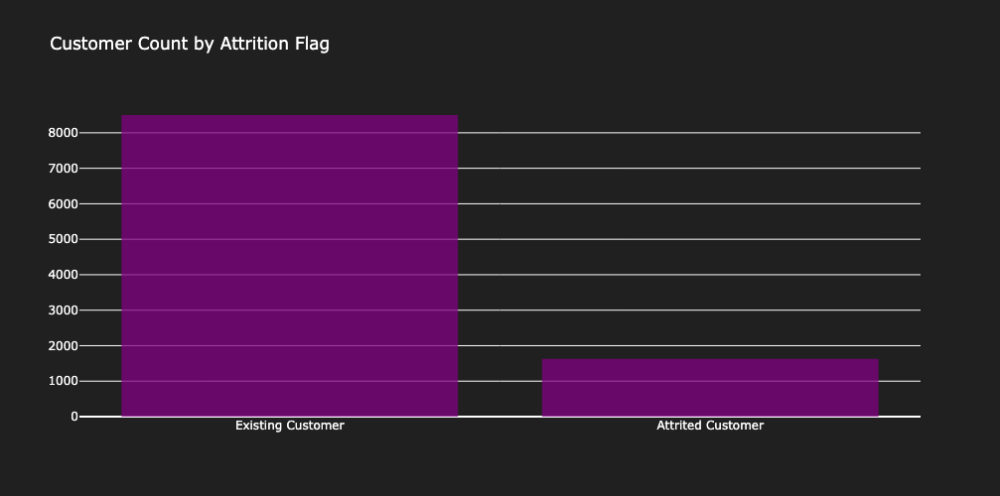

In [12]:
hist_data = go.Histogram(
    x=df["Attrition_Flag"],
    opacity=0.75,
    marker=dict(color='purple')
)

fig = go.Figure(data=[hist_data])

fig.update_layout(
    title="Customer Count by Attrition Flag",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    width=500,
    height=500
)

fig.show()
# fig.write_image("Attrition_Flag.png")

---
### Categorical Data
---

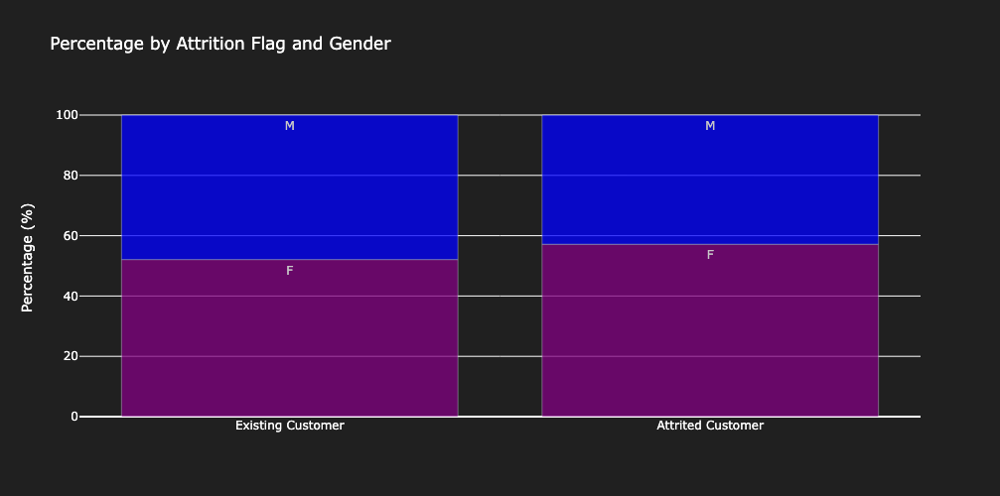

In [19]:
gender_counts = df.groupby(['Attrition_Flag', 'Gender']).size().reset_index(name='counts')
total_counts = df.groupby('Attrition_Flag').size().reset_index(name='total_counts')
percentages = pd.merge(gender_counts, total_counts, on='Attrition_Flag')
percentages['percentage'] = percentages['counts'] / percentages['total_counts'] * 100
percentages = percentages.sort_values(by='total_counts', ascending=False)

bar_data = go.Bar(
    x=percentages['Attrition_Flag'], 
    y=percentages['percentage'], 
    text=percentages['Gender'],
    opacity=0.75,
    marker=dict(color=percentages['Gender'].map({'M': 'blue', 'F': 'purple'}))
)

fig = go.Figure(data=[bar_data])

fig.update_layout(
    title="Percentage by Attrition Flag and Gender",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    xaxis_title="",
    yaxis_title="Percentage (%)",
    width=500,
    height=500
)

# pio.write_image(fig=fig, file="Gender.png", format='png')
fig.show()

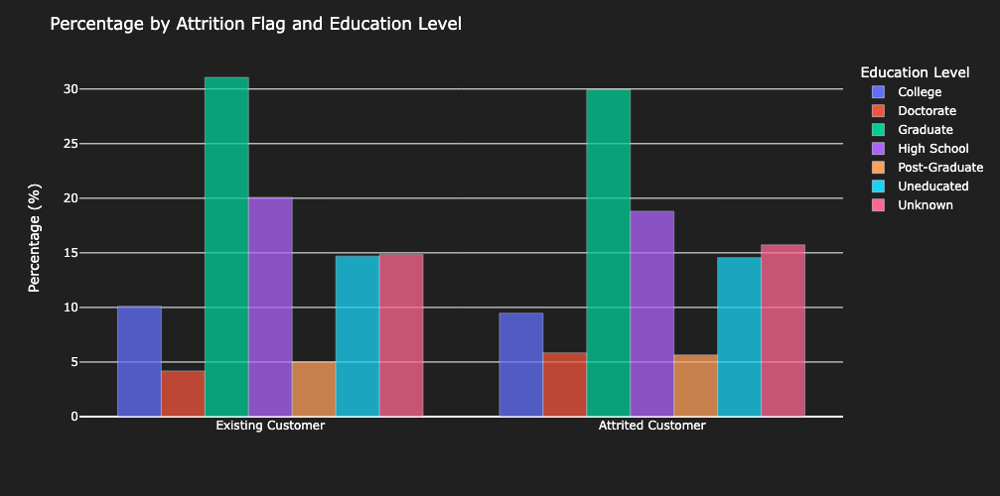

In [23]:
counts = df.groupby(['Attrition_Flag', 'Education_Level']).size().reset_index(name='counts')
percentages = pd.merge(counts, total_counts, on='Attrition_Flag')
percentages['percentage'] = percentages['counts'] / percentages['total_counts'] * 100
percentages = percentages.sort_values(by='total_counts', ascending=False)

fig = px.bar(
    percentages, 
    x='Attrition_Flag', 
    y='percentage', 
    color='Education_Level', 
    barmode='group',
    opacity=0.75
    # text='percentage'
)

fig.update_layout(
    title="Percentage by Attrition Flag and Education Level",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    xaxis_title="",
    yaxis_title="Percentage (%)",
    legend_title_text='Education Level',
    width=600,
    height=500
)

# pio.write_image(fig=fig, file="Education_Level.png", format='png')
fig.show()

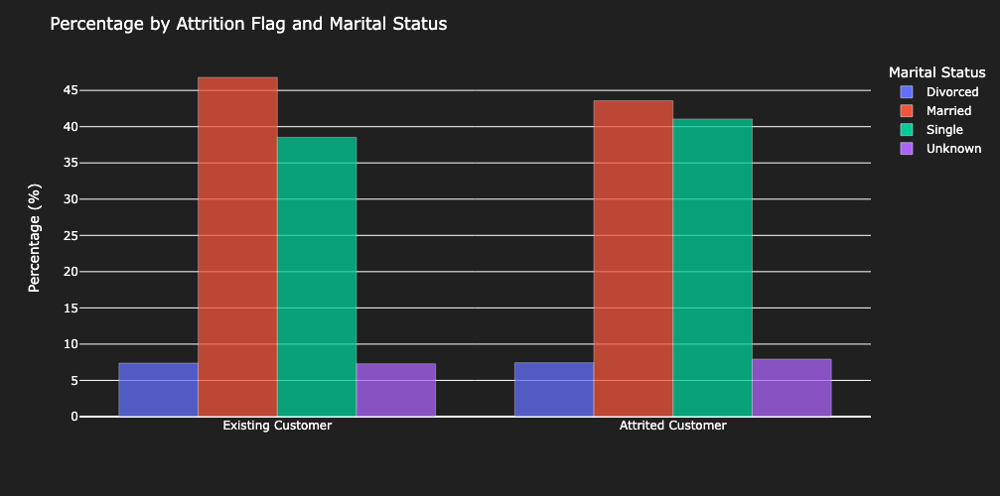

In [21]:
counts = df.groupby(['Attrition_Flag', 'Marital_Status']).size().reset_index(name='counts')
percentages = pd.merge(counts, total_counts, on='Attrition_Flag')
percentages['percentage'] = percentages['counts'] / percentages['total_counts'] * 100
percentages = percentages.sort_values(by='total_counts', ascending=False)

fig = px.bar(
    percentages, 
    x='Attrition_Flag', 
    y='percentage', 
    color='Marital_Status', 
    barmode='group',
    opacity=0.75
    # text='percentage'
)

fig.update_layout(
    title="Percentage by Attrition Flag and Marital Status",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    xaxis_title="",
    yaxis_title="Percentage (%)",
    legend_title_text='Marital Status',
    width=600,
    height=500
)

# pio.write_image(fig=fig, file="Marital_Status.png", format='png')
fig.show()

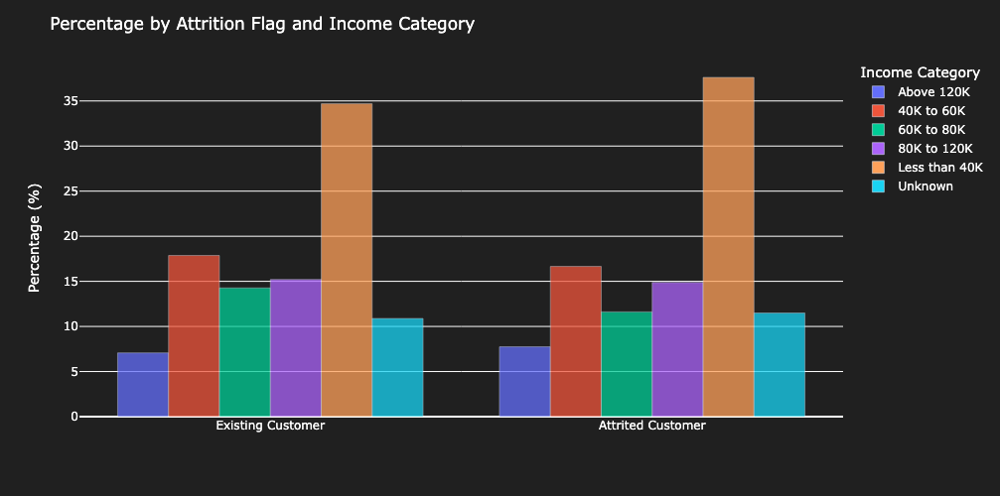

In [24]:
counts = df.groupby(['Attrition_Flag', 'Income_Category']).size().reset_index(name='counts')
percentages = pd.merge(counts, total_counts, on='Attrition_Flag')
percentages['percentage'] = percentages['counts'] / percentages['total_counts'] * 100
percentages = percentages.sort_values(by='total_counts', ascending=False)
percentages['Income_Category_Clean'] = percentages['Income_Category'].replace({
    '$120K +': 'Above 120K',
    '$40K - $60K': '40K to 60K', 
    '$60K - $80K': '60K to 80K',
    '$80K - $120K': '80K to 120K',
    'Less than $40K': 'Less than 40K',
    'Unknown': 'Unknown'
})

fig = px.bar(
    percentages, 
    x='Attrition_Flag', 
    y='percentage', 
    color='Income_Category_Clean', 
    barmode='group',
    opacity=0.75
    # text='percentage'
)

fig.update_layout(
    title="Percentage by Attrition Flag and Income Category",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    xaxis_title="",
    yaxis_title="Percentage (%)",
    legend_title_text='Income Category',
    width=600,
    height=500
)

# pio.write_image(fig=fig, file="Income_Category.png", format='png')
fig.show()

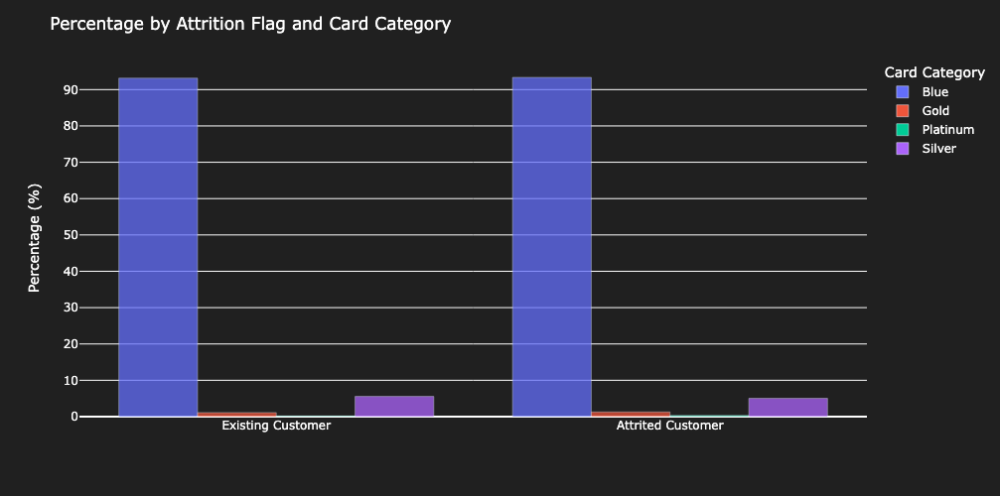

In [22]:
counts = df.groupby(['Attrition_Flag', 'Card_Category']).size().reset_index(name='counts')
percentages = pd.merge(counts, total_counts, on='Attrition_Flag')
percentages['percentage'] = percentages['counts'] / percentages['total_counts'] * 100
percentages = percentages.sort_values(by='total_counts', ascending=False)

fig = px.bar(
    percentages, 
    x='Attrition_Flag', 
    y='percentage', 
    color='Card_Category', 
    barmode='group',
    opacity=0.75
    # text='percentage'
)

fig.update_layout(
    title="Percentage by Attrition Flag and Card Category",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    xaxis_title="",
    yaxis_title="Percentage (%)",
    legend_title_text='Card Category',
    width=600,
    height=500
)

# pio.write_image(fig=fig, file="Card_Category.png", format='png')
fig.show()

---
### Numerical Data
---

In [25]:
df["Attrition_Flag"] = np.where(df["Attrition_Flag"] == "Existing Customer", 0 , 1)
df["Attrition_Flag"].value_counts()

Attrition_Flag
0    8500
1    1627
Name: count, dtype: int64

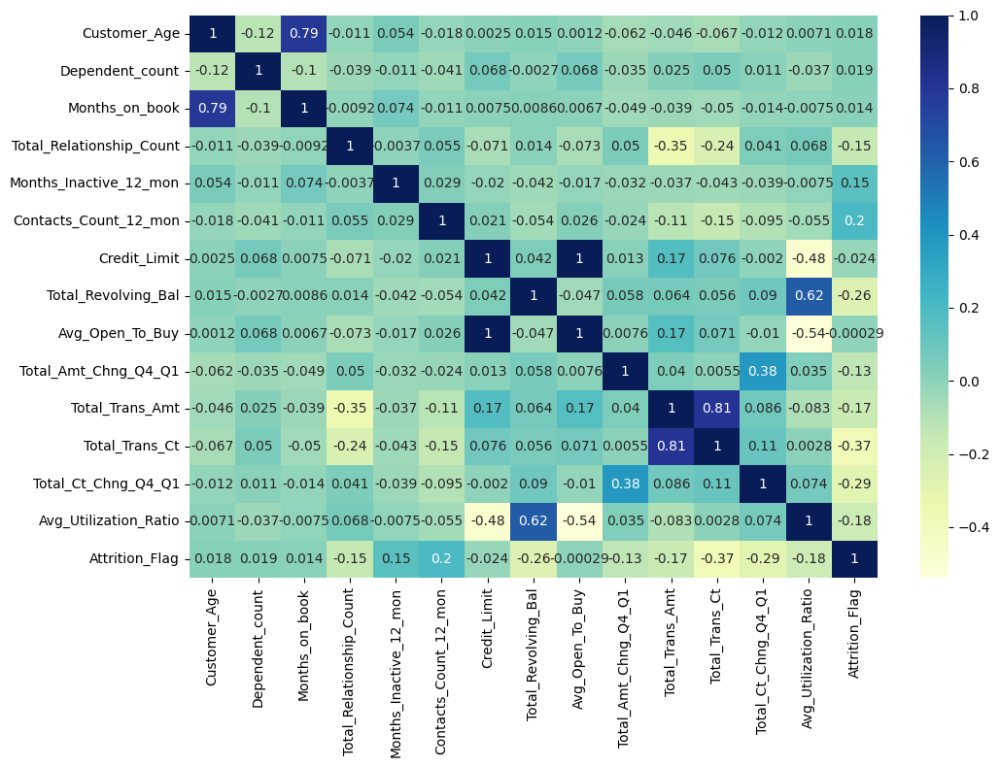

In [27]:
fig, ax = plt.subplots(figsize=(11, 8))
sns.heatmap(pd.concat([numerical_features, df["Attrition_Flag"]], axis=1).corr(), annot=True, cmap="YlGnBu", ax=ax)
plt.tight_layout()

# plt.savefig("heatmap.png")
plt.show()

---
#### High Correlation Variables
---

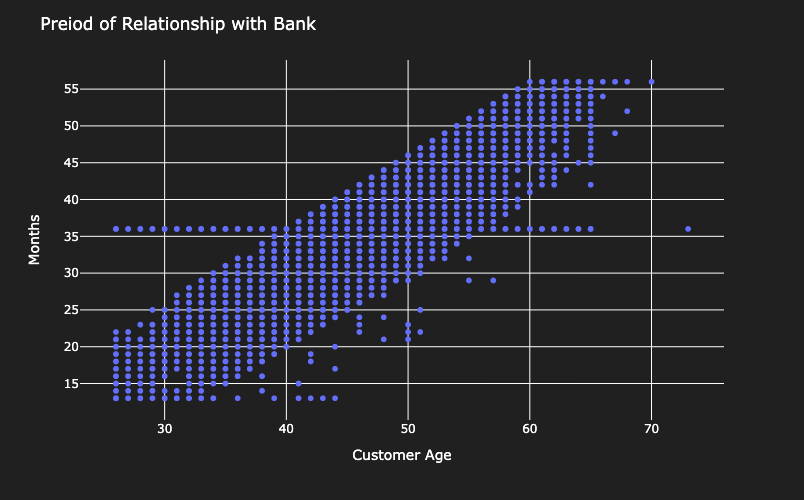

In [29]:
fig = px.scatter(df, x="Customer_Age", y="Months_on_book",
                labels={
                    "Customer_Age": "Age",
                    "Months_on_book": "Months"
                })

fig.update_layout(
    title="Preiod of Relationship with Bank",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    xaxis_title="Customer Age",
    yaxis_title="Months",
    legend_title_text='Age',
    width=600,
    height=500
)

# pio.write_image(fig=fig, file='Months_on_book.png', format='png')
fig.show()

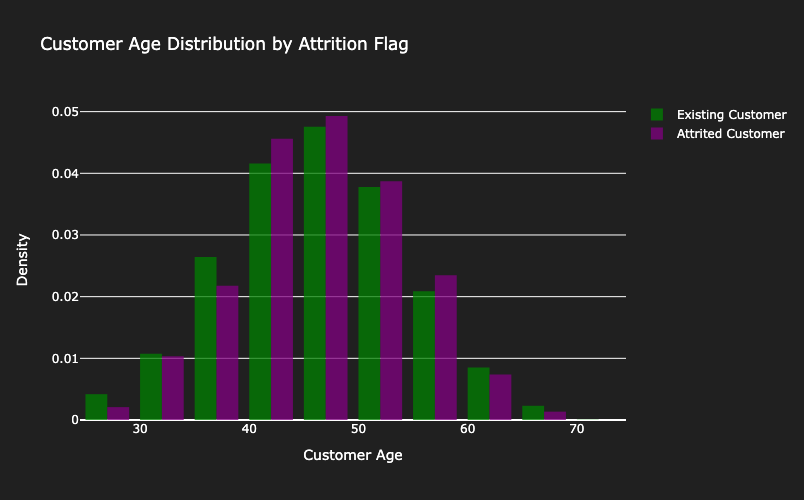

In [30]:
hist_data_0 = go.Histogram(
    x=df[df['Attrition_Flag'] == 0]['Customer_Age'],
    nbinsx=20, name="Existing Customer",
    opacity=0.75, histnorm='probability density',
    marker=dict(color='green')
)

hist_data_1 = go.Histogram(
    x=df[df['Attrition_Flag'] == 1]['Customer_Age'],
    nbinsx=20, name="Attrited Customer",
    opacity=0.75, histnorm='probability density',
    marker=dict(color='purple')
)

fig = go.Figure(data=[hist_data_0, hist_data_1])

fig.update_layout(
    title="Customer Age Distribution by Attrition Flag",
    xaxis_title="Customer Age",
    yaxis_title="Density",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    width=600,
    height=500
)

# pio.write_image(fig=fig, file='hist_Months_on_book.png', format='png')
fig.show()

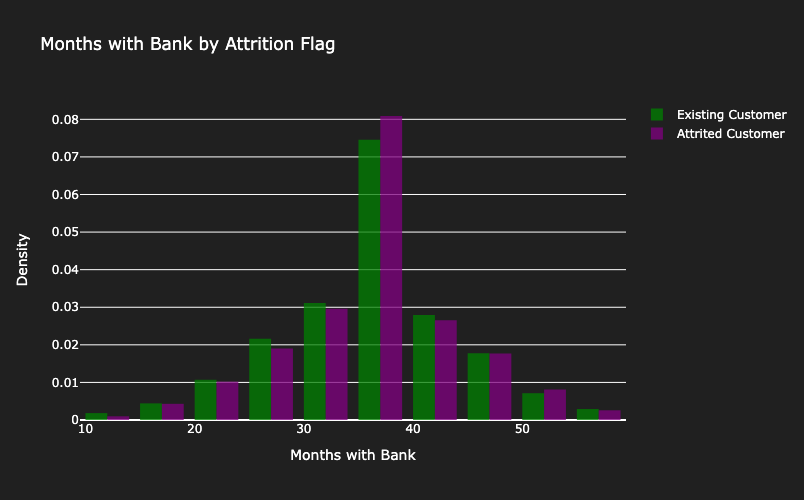

In [31]:
hist_data_0 = go.Histogram(
    x=df[df['Attrition_Flag'] == 0]['Months_on_book'],
    nbinsx=20, name="Existing Customer",
    opacity=0.75, histnorm='probability density',
    marker=dict(color='green')
)

hist_data_1 = go.Histogram(
    x=df[df['Attrition_Flag'] == 1]['Months_on_book'],
    nbinsx=20, name="Attrited Customer",
    opacity=0.75, histnorm='probability density',
    marker=dict(color='purple')
)

fig = go.Figure(data=[hist_data_0, hist_data_1])

fig.update_layout(
    title="Months with Bank by Attrition Flag",
    xaxis_title="Months with Bank",
    yaxis_title="Density",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    width=600,
    height=500
)

# pio.write_image(fig=fig, file='hist_customer_age.png', format='png')
fig.show()

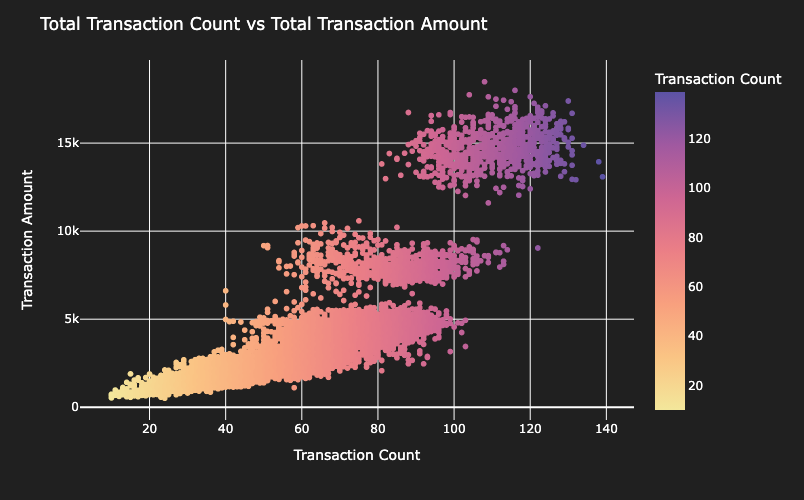

In [34]:
fig = px.scatter(df, x="Total_Trans_Ct", y="Total_Trans_Amt",
                labels={
                    "Total_Trans_Ct": "Transaction Count",
                    "Total_Trans_Amt": "Transaction Amount"
                },
                color='Total_Trans_Ct', 
                color_continuous_scale=px.colors.sequential.Sunset)

fig.update_layout(
    title="Total Transaction Count vs Total Transaction Amount",
    xaxis_title="Transaction Count",
    yaxis_title="Transaction Amount",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    width=600,
    height=500
)

# pio.write_image(fig=fig, file='scatter_transaction.png', format='png')
fig.show()

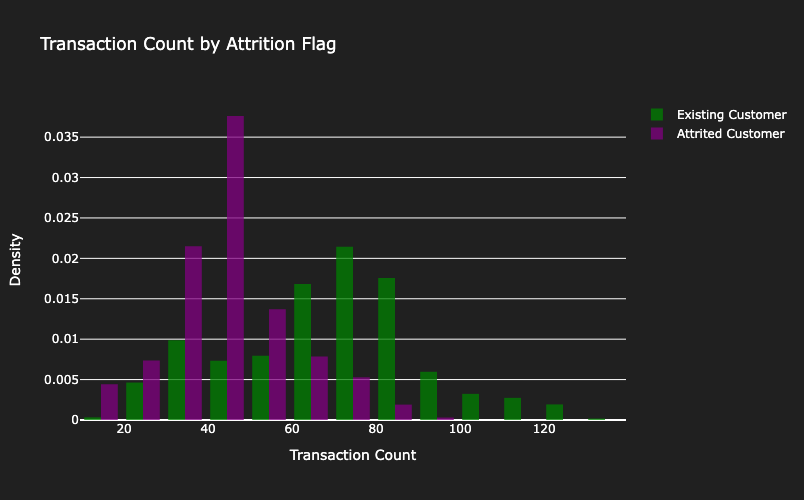

In [38]:
hist_data_0 = go.Histogram(
    x=df[df['Attrition_Flag'] == 0]['Total_Trans_Ct'],
    nbinsx=20, name="Existing Customer",
    opacity=0.75, histnorm='probability density',
    marker=dict(color='green')
)

hist_data_1 = go.Histogram(
    x=df[df['Attrition_Flag'] == 1]['Total_Trans_Ct'],
    nbinsx=20, name="Attrited Customer",
    opacity=0.75, histnorm='probability density',
    marker=dict(color='purple')
)

fig = go.Figure(data=[hist_data_0, hist_data_1])

fig.update_layout(
    title="Transaction Count by Attrition Flag",
    xaxis_title="Transaction Count",
    yaxis_title="Density",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    width=600,
    height=500
)

# pio.write_image(fig=fig, file='hist_transaction_count.png', format='png')
fig.show()

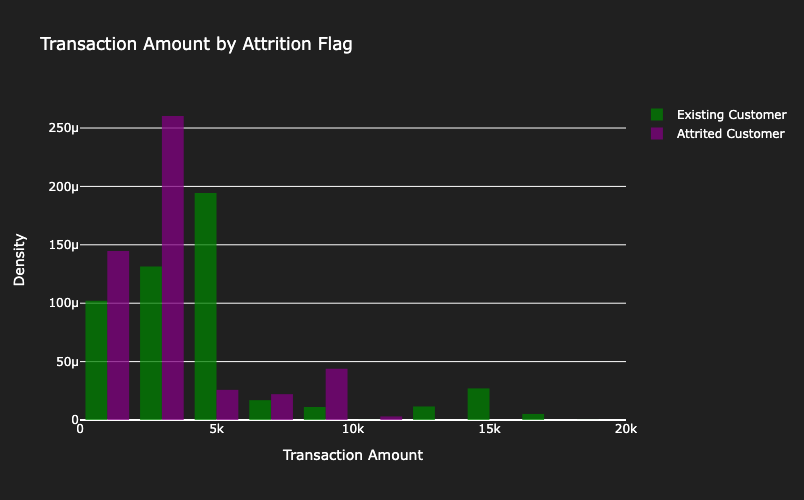

In [39]:
hist_data_0 = go.Histogram(
    x=df[df['Attrition_Flag'] == 0]['Total_Trans_Amt'],
    nbinsx=10, name="Existing Customer",
    opacity=0.75, histnorm='probability density',
    marker=dict(color='green')
)

hist_data_1 = go.Histogram(
    x=df[df['Attrition_Flag'] == 1]['Total_Trans_Amt'],
    nbinsx=10, name="Attrited Customer",
    opacity=0.75, histnorm='probability density',
    marker=dict(color='purple')
)

fig = go.Figure(data=[hist_data_0, hist_data_1])

fig.update_layout(
    title="Transaction Amount by Attrition Flag",
    xaxis_title="Transaction Amount",
    yaxis_title="Density",
    plot_bgcolor='rgba(32, 32, 32, 1)',
    paper_bgcolor='rgba(32, 32, 32, 1)',
    font=dict(color='white'),
    width=600,
    height=500
)

# pio.write_image(fig=fig, file='hist_transaction_amount.png', format='png')
fig.show()

---
### The Rest of the Numerical Variables
---

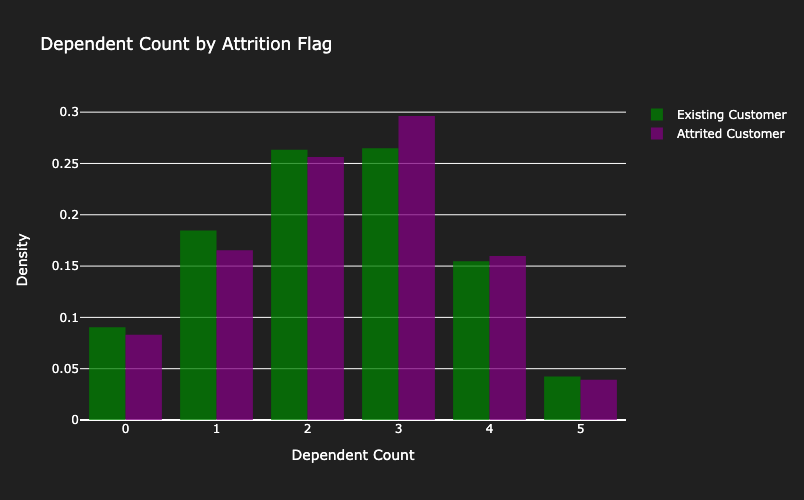

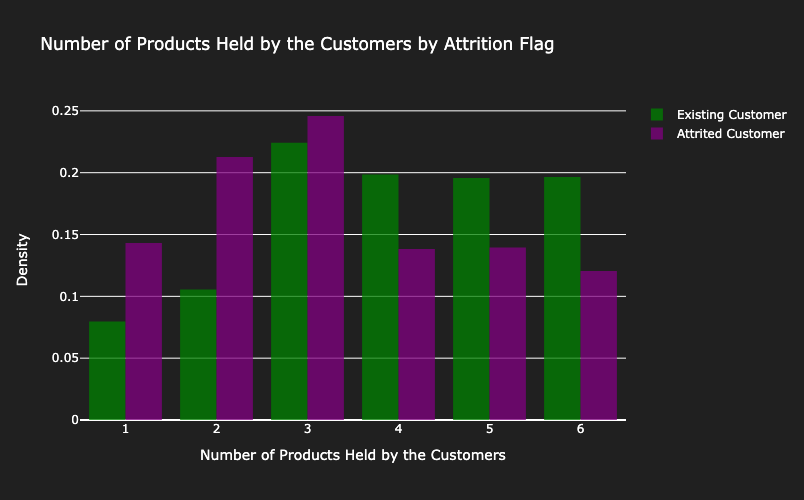

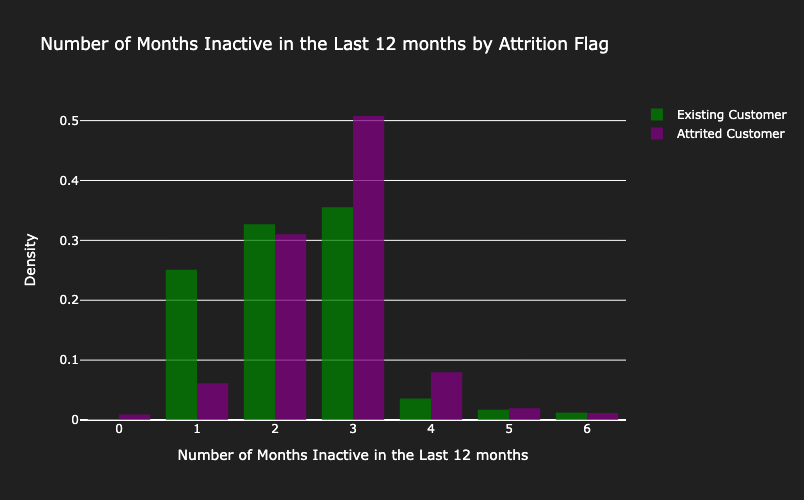

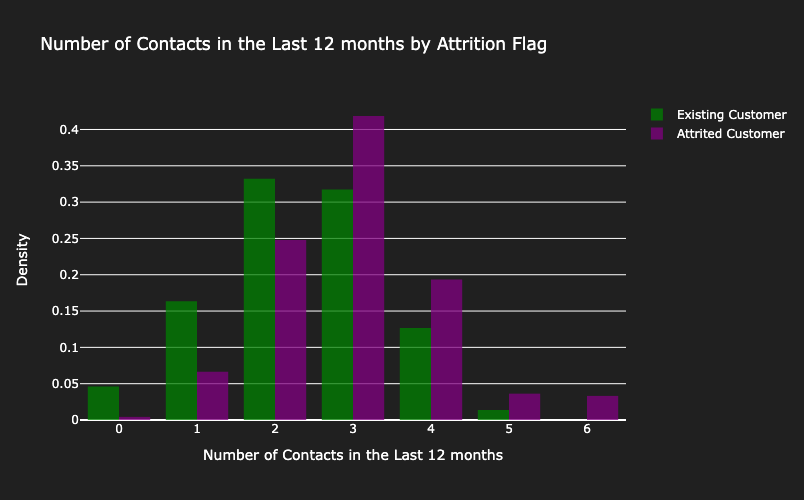

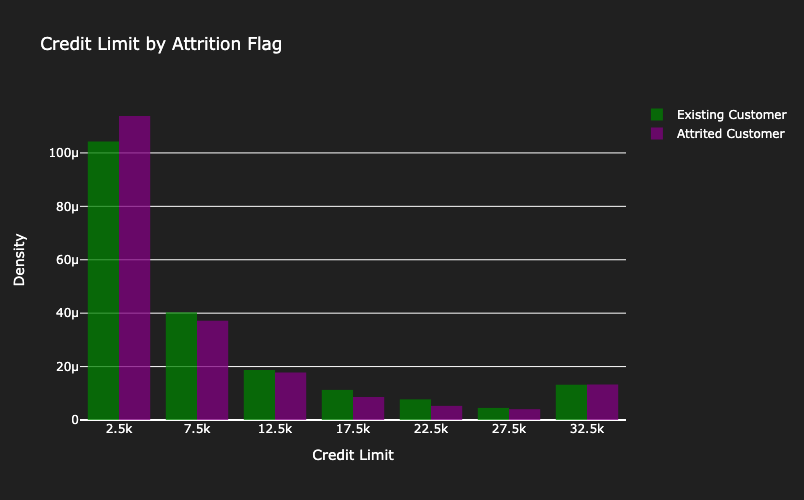

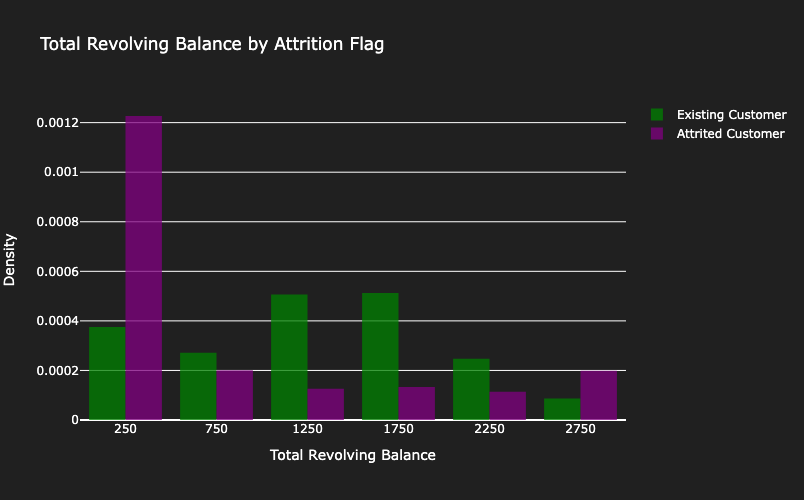

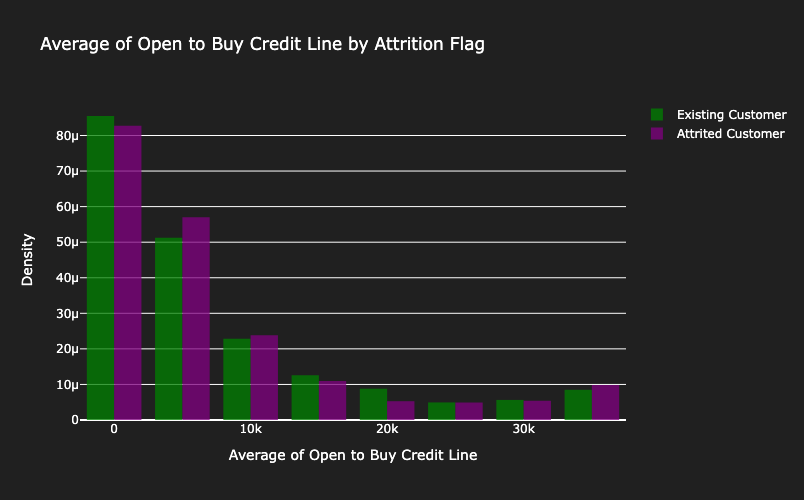

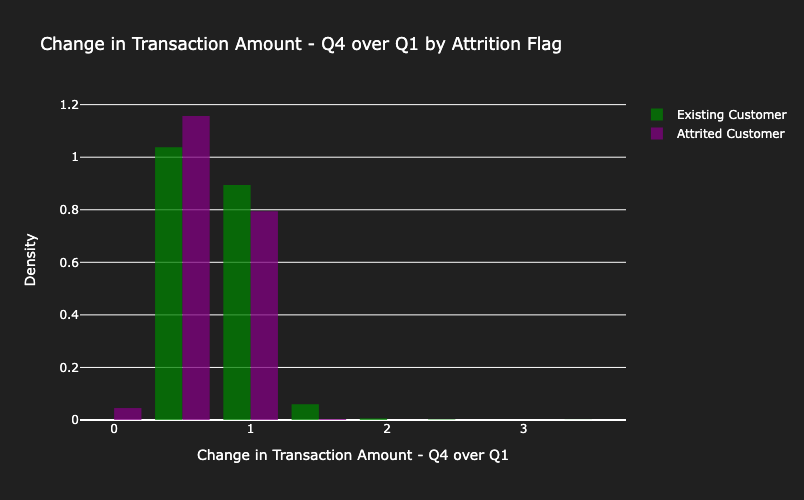

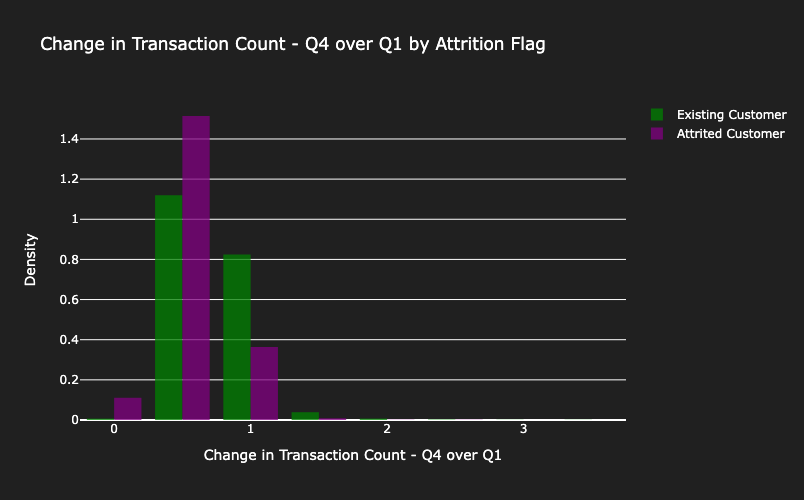

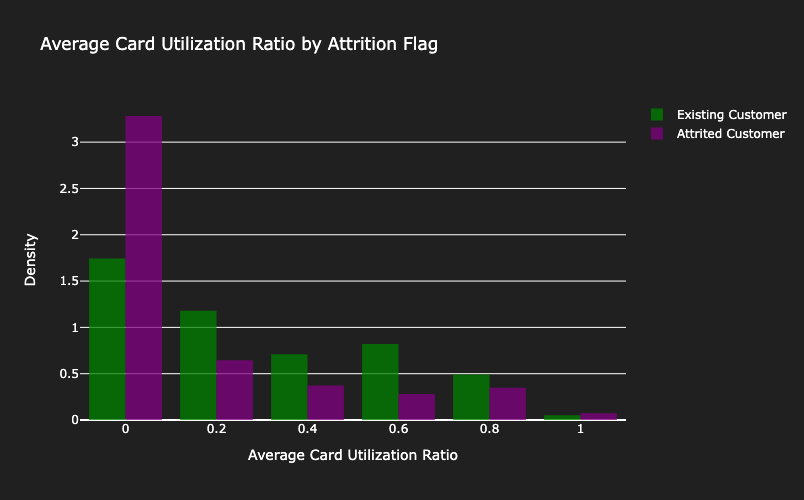

In [40]:
columns = numerical_features.columns.drop(["Customer_Age", "Months_on_book", "Total_Trans_Amt", "Total_Trans_Ct"])
columns_map = {"Dependent_count": "Dependent Count",
              "Total_Relationship_Count": "Number of Products Held by the Customers",
              "Months_Inactive_12_mon": "Number of Months Inactive in the Last 12 months",
              "Contacts_Count_12_mon": "Number of Contacts in the Last 12 months",
              "Credit_Limit": "Credit Limit",
              "Total_Revolving_Bal": "Total Revolving Balance",
              "Avg_Open_To_Buy": "Average of Open to Buy Credit Line",
              "Total_Amt_Chng_Q4_Q1": "Change in Transaction Amount - Q4 over Q1",
              "Total_Ct_Chng_Q4_Q1": "Change in Transaction Count - Q4 over Q1",
              "Avg_Utilization_Ratio": "Average Card Utilization Ratio",
              "Customer_Age": "Customer Age",
              "Months_on_book": "Relationship with Bank in Months",
              "Total_Trans_Amt": "Total Transcation Amount",
              "Total_Trans_Ct": "Total Transaction Count"}

for column in columns:
    hist_data_0 = go.Histogram(
        x=df[df['Attrition_Flag'] == 0][column],
        nbinsx=8, name="Existing Customer",
        opacity=0.75, histnorm='probability density',
        marker=dict(color='green')
    )
    
    hist_data_1 = go.Histogram(
        x=df[df['Attrition_Flag'] == 1][column],
        nbinsx=8, name="Attrited Customer",
        opacity=0.75, histnorm='probability density',
        marker=dict(color='purple')
    )
    
    fig = go.Figure(data=[hist_data_0, hist_data_1])
    
    fig.update_layout(
        title=f"{columns_map[column]} by Attrition Flag",
        xaxis_title=f"{columns_map[column]}",
        yaxis_title="Density",
        plot_bgcolor='rgba(32, 32, 32, 1)',
        paper_bgcolor='rgba(32, 32, 32, 1)',
        font=dict(color='white'),
        width=600,
        height=500
    )

    # pio.write_image(fig=fig, file=f'hist_{column}.png', format='png')
    fig.show()
    print("\n")

---
## Data Preprocessing
---

In [25]:
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df['Attrition_Flag'])

# Downsampling the majority class in the training set
majority_class = train_df[train_df['Attrition_Flag'] == 0]
minority_class = train_df[train_df['Attrition_Flag'] == 1]

# Sample the majority class
downsampled_majority_class = majority_class.sample(len(minority_class), random_state=42)

# Combine downsampled majority class with minority class
balanced_train_df = pd.concat([downsampled_majority_class, minority_class])

In [26]:
# Split the training dataset and testing datatset into input and output
X_train = balanced_train_df.iloc[:, 1:]
y_train = balanced_train_df.iloc[:, 0]
X_test = test_df.drop(columns=["Attrition_Flag"])
y_test = test_df["Attrition_Flag"]

In [27]:
categorical_features = X_train.select_dtypes(include=[object])
numerical_features = X_train.select_dtypes(include=[np.number])

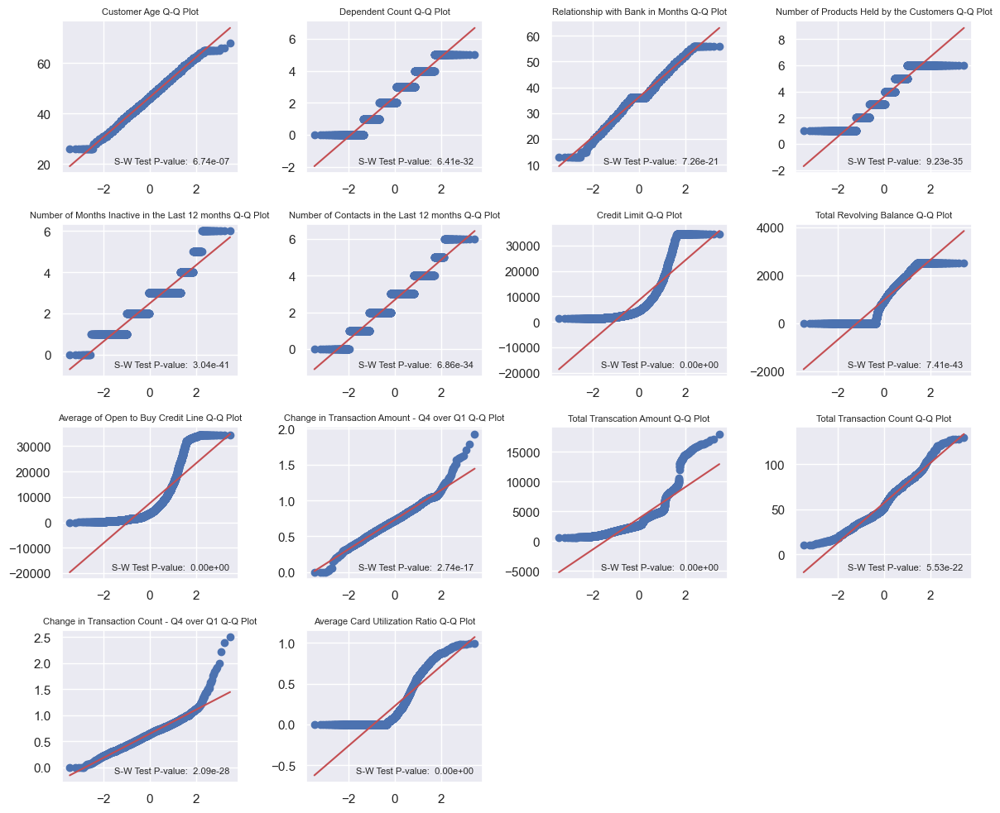

In [28]:
# Check the normality of each numerical feature 
from scipy import stats
sns.set_theme(style='darkgrid')
fig, axes = plt.subplots(4, 4, figsize=(12, 10))

axes = axes.flatten()

for i, feature in enumerate(numerical_features.columns):
    stats.probplot(numerical_features[feature], dist="norm", plot=axes[i])
    axes[i].set_title(f"{columns_map[feature]} Q-Q Plot", fontsize=8)
    axes[i].set_xlabel("")
    axes[i].set_ylabel("")

    # Perform Shapiro-Wilk test
    shapiro_stat, shapiro_p = stats.shapiro(numerical_features[feature])

    # Annotate Shapiro-Wilk test statistic
    axes[i].annotate(f'S-W Test P-value: {shapiro_p: .2e}', xy=(0.95, 0.05), xycoords='axes fraction',
                     ha='right', va='bottom', fontsize=8)
    
for ax in axes[len(numerical_features.columns):]:
    ax.remove()
    
plt.tight_layout()
plt.show()

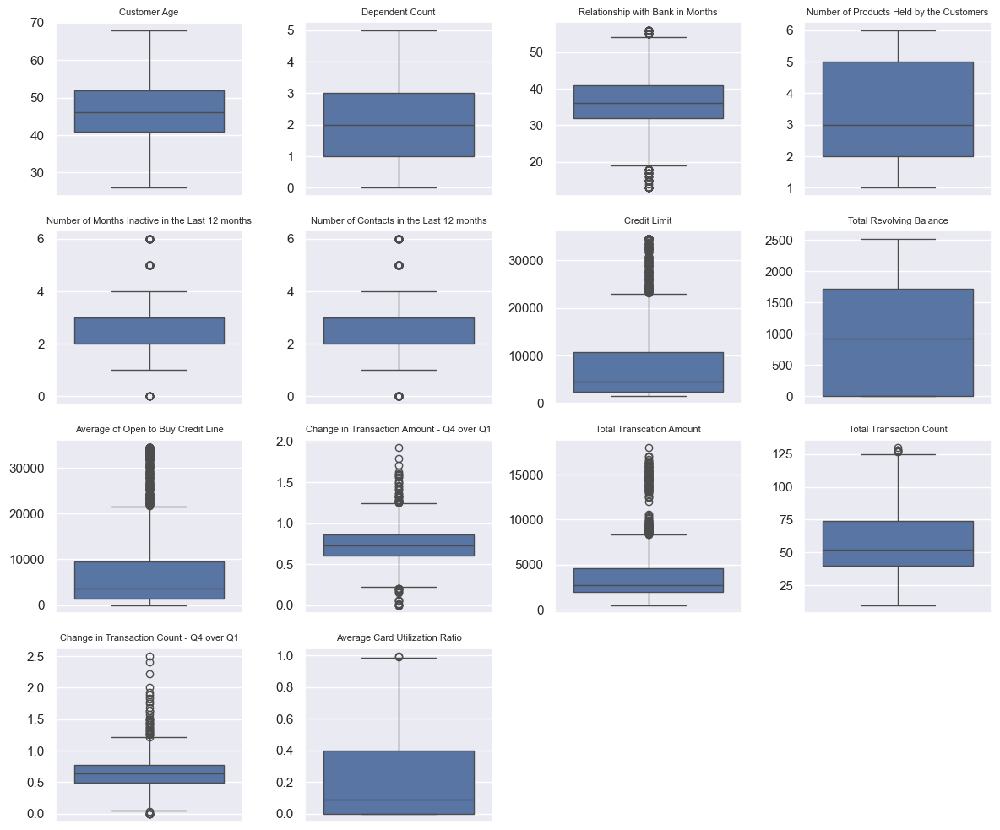

In [29]:
# Boxplot to check for outliers and variances
fig, axes = plt.subplots(4, 4, figsize=(12, 10))

axes = axes.flatten()

# Create a boxplot for each feature
for i, feature in enumerate(numerical_features.columns):
    sns.boxplot(y=feature, data=numerical_features, ax=axes[i])
    axes[i].set_title(f"{columns_map[feature]}", fontsize=8)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

for ax in axes[len(numerical_features.columns):]:
    ax.remove()

plt.tight_layout()
plt.show()

---
### Creating Pipelines
---

In [30]:
# Most of the numerical values contain outliers, RobustScaler works well in this situation
numerical_transformer = Pipeline(steps=[
    ('scaler', RobustScaler())
])

categorical_transformer = Pipeline(steps=[
    ('scaler', OneHotEncoder(drop='first'))
])

numerical_columns = X_train.select_dtypes(include=[np.number]).columns
categorical_columns = X_train.select_dtypes(include=[object]).columns

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_columns),
        ('cat', categorical_transformer, categorical_columns)
    ],remainder = 'passthrough')

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor)])

In [31]:
X_preprocessed = pipeline.fit_transform(X_train)
column_names = pipeline.named_steps['preprocessor'].get_feature_names_out()
X_preprocessed_df = pd.DataFrame(X_preprocessed, columns=column_names)

In [32]:
X_preprocessed_df.columns

Index(['num__Customer_Age', 'num__Dependent_count', 'num__Months_on_book',
       'num__Total_Relationship_Count', 'num__Months_Inactive_12_mon',
       'num__Contacts_Count_12_mon', 'num__Credit_Limit',
       'num__Total_Revolving_Bal', 'num__Avg_Open_To_Buy',
       'num__Total_Amt_Chng_Q4_Q1', 'num__Total_Trans_Amt',
       'num__Total_Trans_Ct', 'num__Total_Ct_Chng_Q4_Q1',
       'num__Avg_Utilization_Ratio', 'cat__Gender_M',
       'cat__Education_Level_Doctorate', 'cat__Education_Level_Graduate',
       'cat__Education_Level_High School',
       'cat__Education_Level_Post-Graduate', 'cat__Education_Level_Uneducated',
       'cat__Education_Level_Unknown', 'cat__Marital_Status_Married',
       'cat__Marital_Status_Single', 'cat__Marital_Status_Unknown',
       'cat__Income_Category_$40K - $60K', 'cat__Income_Category_$60K - $80K',
       'cat__Income_Category_$80K - $120K',
       'cat__Income_Category_Less than $40K', 'cat__Income_Category_Unknown',
       'cat__Card_Category_Go

In [33]:
X_test = pipeline.transform(X_test)
X_test_df = pd.DataFrame(X_test, columns=column_names)

---
## Model Construction
---

In [34]:
random_state = 42

models = {
    'RandomForestClassifier': RandomForestClassifier(random_state=random_state),
    'SVC': SVC(random_state=random_state),
    'XGBoost': xgb.XGBClassifier(random_state=random_state)
}

for model_name, model in models.items():
    clf = model
    clf.fit(X_preprocessed, y_train)
    y_pred_train = clf.predict(X_preprocessed)
    y_pred_test = clf.predict(X_test)
    
    print(f"\n{model_name}")
    print("Accuracy Score:")
    train_accuracy_score = accuracy_score(y_train, y_pred_train)
    test_accuracy_score = accuracy_score(y_test, y_pred_test)
    print(f"Train: {train_accuracy_score}")
    print(f"Test: {test_accuracy_score}")
          
    print("Recall Score:")
    train_recall_score = recall_score(y_train, y_pred_train)
    test_recall_score = recall_score(y_test, y_pred_test)
    print(f"Train: {train_recall_score}")
    print(f"Test: {test_recall_score}")


RandomForestClassifier
Accuracy Score:
Train: 1.0
Test: 0.9249753208292202
Recall Score:
Train: 1.0
Test: 0.9292307692307692

SVC
Accuracy Score:
Train: 0.9370199692780338
Test: 0.8963474827245804
Recall Score:
Train: 0.9485407066052227
Test: 0.8953846153846153

XGBoost
Accuracy Score:
Train: 1.0
Test: 0.947680157946693
Recall Score:
Train: 1.0
Test: 0.9292307692307692


---
Both Random Forest and XGBoost Models tend to have a promising result but suffer from overfitting because the accuracy scores are 1.0. Since XGBoost has a slightly higher accuracy score on the test set, it is chosen for the prediction.

---
### Hyper-Tuning XGBoost Model
---

In [55]:
# First Round of Param Grid
param_grid = {
    'max_depth': [3, 5 , 7],
    'eta': [0.01, 0.1, 0.5],
    'gamma': [0, 0.01, 0.1],
    'subsample': [0.5, 0.7, 1]
}

clf = xgb.XGBClassifier(random_state=42)

grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_preprocessed_df, y_train)

print("Best set of hyperparameters: ", grid_search.best_params_)
print("Best score: ", grid_search.best_score_)

Best set of hyperparameters:  {'eta': 0.5, 'gamma': 0.1, 'max_depth': 3, 'subsample': 1}
Best score:  0.9546877306954082


In [56]:
# Second Round of Param Grid
param_grid_2 = {
    'max_depth': [1, 2, 3],
    'eta': [0.5, 0.7, 1],
    'gamma': [0.1, 1, 10]
}

clf = xgb.XGBClassifier(random_state=42)

grid_search_2 = GridSearchCV(clf, param_grid_2, cv=5, scoring='accuracy')
grid_search_2.fit(X_preprocessed_df, y_train)

print("Best set of hyperparameters: ", grid_search_2.best_params_)
print("Best score: ", grid_search_2.best_score_)

Best set of hyperparameters:  {'eta': 0.5, 'gamma': 0.1, 'max_depth': 3}
Best score:  0.9546877306954082


In [57]:
# fitting the Best model
best_model = grid_search.best_estimator_
y_pred_best = best_model.predict(X_test_df)

---
### XGBoost Evaluation
---

Accuracy Score: 0.9506416584402764
Recall Score: 0.9292307692307692


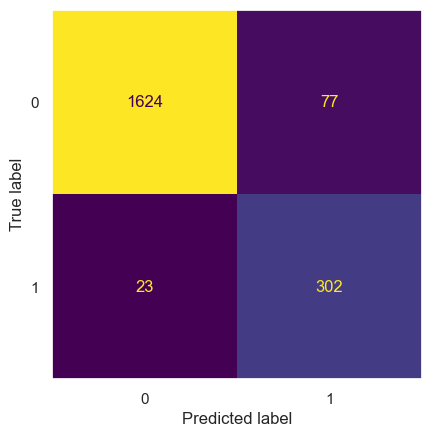

In [58]:
accuracy = accuracy_score(y_test, y_pred_best)
recall = recall_score(y_test, y_pred_best)
print(f"Accuracy Score: {accuracy}")
print(f"Recall Score: {recall}")

confusion_matrix_disp = confusion_matrix(y_test, y_pred_best)
disp = ConfusionMatrixDisplay(confusion_matrix_disp)
disp.plot(include_values=True, cmap='viridis', ax=None, xticks_rotation='horizontal', colorbar=False)
plt.grid(False)
plt.show()

In [59]:
# Check feature importances
feature_importances = best_model.feature_importances_
feature_importance_dict = dict(zip(X_test_df.columns, best_model.feature_importances_))
feature_importance_dict = sorted(feature_importance_dict.items(), key=lambda item: item[1], reverse=True)

feature_importance_dict[:5]

[('num__Total_Trans_Ct', 0.2905465),
 ('num__Total_Relationship_Count', 0.14234863),
 ('num__Total_Revolving_Bal', 0.1147246),
 ('num__Total_Trans_Amt', 0.068709396),
 ('num__Months_Inactive_12_mon', 0.053978704)]

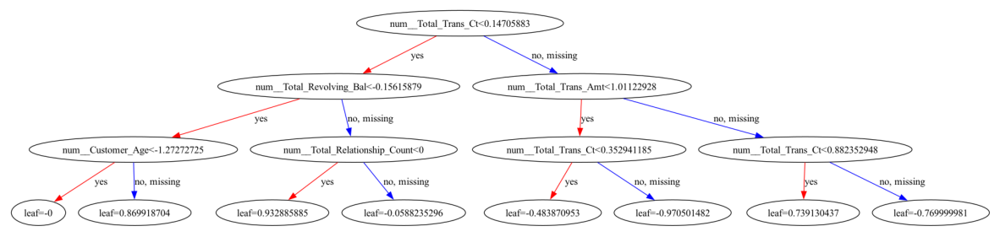

In [63]:
# Tree visualization
fig, ax = plt.subplots(figsize=(15,20))

plot_tree(best_model, num_trees=0, ax=ax)

plt.show()

---
## Using Unscaled data on XGBoost
---

In [74]:
unscaled_df = balanced_train_df.copy()
unscaled_df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
3812,0,54,F,3,Uneducated,Single,Less than $40K,Blue,47,3,3,3,7477.0,1960,5517.0,1.008,3618,76,0.583,0.262
7847,0,42,F,1,College,Married,Less than $40K,Blue,35,2,1,3,2873.0,2517,356.0,0.803,4897,71,1.088,0.876
3293,0,34,F,2,Unknown,Single,Less than $40K,Blue,29,3,1,0,5387.0,795,4592.0,0.837,2596,59,1.034,0.148
6171,0,48,F,3,Unknown,Married,Less than $40K,Blue,43,3,1,2,3119.0,2196,923.0,0.810,4705,77,1.200,0.704
1447,0,33,M,2,Graduate,Married,$40K - $60K,Blue,20,4,3,3,5657.0,1792,3865.0,0.904,1914,46,0.769,0.317


In [79]:
# One Hot Encoding
unscaled_df = pd.get_dummies(unscaled_df, columns=categorical_columns, drop_first=True)
test_df = pd.get_dummies(test_df, columns=categorical_columns, drop_first=True)

In [82]:
# Partitioning of the dataset
X_train_raw = unscaled_df.drop(columns=["Attrition_Flag"])
y_train_raw = unscaled_df["Attrition_Flag"]
X_test_raw = test_df.drop(columns=["Attrition_Flag"])
y_test_raw = test_df["Attrition_Flag"]

In [83]:
# Fit and Predict based on the raw dataset
clf_raw = xgb.XGBClassifier(random_state=42, eta=0.5, gamma=0.1, max_depth=3, subsample=1)
clf_raw.fit(X_train_raw, y_train_raw)
y_pred_raw = clf_raw.predict(X_test_raw)

Accuracy Score: 0.9506416584402764
Recall Score: 0.9292307692307692


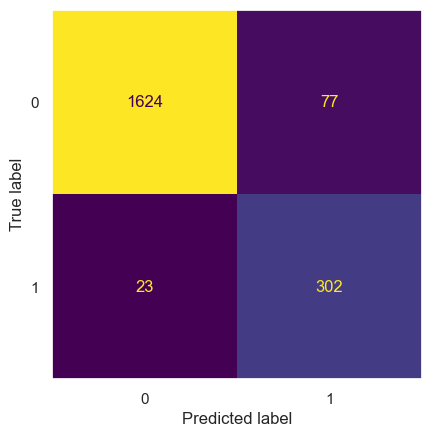

In [86]:
# Accuray and Confusion Matrix
accuracy_raw = accuracy_score(y_test, y_pred_raw)
recall_raw = recall_score(y_test, y_pred_raw)
precision_raw = precision_score(y_test, y_pred_raw)
print(f"Accuracy Score: {accuracy_raw}")
print(f"Recall Score: {recall_raw}")
print(f"Precision Score: {precision_raw}")

confusion_matrix_disp_raw = confusion_matrix(y_test, y_pred_raw)
disp_raw = ConfusionMatrixDisplay(confusion_matrix_disp_raw)
disp_raw.plot(include_values=True, cmap='viridis', ax=None, xticks_rotation='horizontal', colorbar=False)
plt.grid(False)
plt.show()

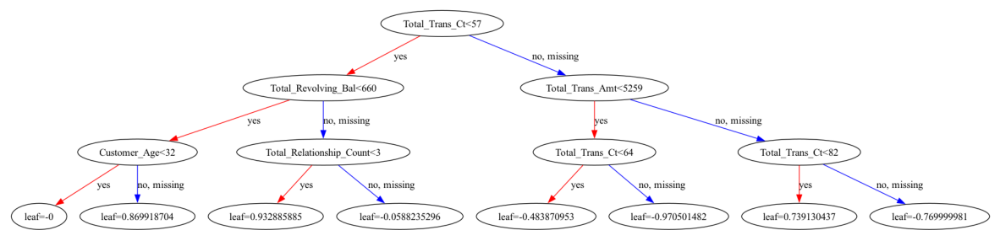

In [88]:
# Plot a Tree
fig, ax = plt.subplots(figsize=(15,20))

plot_tree(clf_raw, num_trees=0, ax=ax)

plt.show()